## Evolution of characters throughout the series

In [1]:
from utils import *

In [2]:
df = pd.read_csv('characters.csv')

In [3]:
df

,character,character_firstname
0,Aaron,Aaron
1,Abdel Fadlan,Abdel
2,Abelard,Abelard
3,Abuelo Santiago,Abuelo
4,Achelous,Achelous
...,...,...
1484,Zia Rashid,Zia
1485,Zoe,Zoe
1486,Zyanya,Zyanya
1487,Łigai,Łigai


In [4]:
# Initializing empty list for graphs from books
books_graph = []
all_books = [b for b in os.scandir('data') if '.txt' in b.name]
# Load spacy English languague model
nlp = spacy.load("en_core_web_sm")

# Sort dir entries by name
all_books.sort(key=lambda x: x.name)
all_books

[<DirEntry '01 The Lightning Thief.txt'>,
 <DirEntry '02. The Sea of Monsters.txt'>,
 <DirEntry '03. the-titans-curse.txt'>,
 <DirEntry '04. the-battle-of-the-labyrinth.txt'>,
 <DirEntry '05. the_last_olympian.txt'>,
 <DirEntry '06. The Lost Hero.txt'>,
 <DirEntry '07. The Son of Neptune.txt'>,
 <DirEntry '08. The Mark of Athena.txt'>,
 <DirEntry '09. The House of Hades.txt'>,
 <DirEntry '10. The Blood of Olympus.txt'>]

In [5]:
book = all_books[0]
book_text = open(book, encoding='utf-8').read()
book_doc = nlp(book_text)
sent_df = get_char_in_sentence(book_doc)

In [6]:
sent_df

,sentence,Characters
0,"(1, ., |, Accidentally, Vaporize, My, Pre, -, ...","[1, Accidentally Vaporize My Pre-algebra, 2]"
1,"(Three, Old, Ladies, Knit, the, Socks, of, Dea...","[Three, 3]"
2,"(Grover, Unexpectedly, Loses, His, Pants, \n\n...","[Grover Unexpectedly Loses His Pants, 4]"
3,"(My, Mother, Teaches, Me, Bullfighting, \n\n, ...",[5]
4,"(I, Play, Pinochle, with, a, Horse, \n\n, 6, ....","[Horse, 6, 1, Bathroom, 7]"
...,...,...
9422,"(I, did, n’t, know, it, at, the, time, ,, but,...",[our afternoon]
9423,"(In, fact, ,, I, would, n’t, be, seeing, home,...",[]
9424,"(As, I, stepped, outside, ,, I, glanced, at, t...",[]
9425,"(Just, for, a, second, I, saw, a, dark, shape,...",[]


In [7]:
# Loop through book list and create graphs
for book_entry in all_books:
    book_path = book_entry.path
    book_text = ner(book_path)
    
    # Get list of characters per sentences
    sent_df = get_char_in_sentence(book_text)
    
    # Select only character names
    sent_df['character_name'] = sent_df['Characters'].apply(lambda x: filter_df(x, df))

    # Filter out sentences that don't have any character entities
    sent_df_filtered = sent_df[sent_df['character_name'].map(len) > 0]
    
    # Take only first name of characters
    sent_df_filtered['character_name'] = sent_df_filtered['character_name'].apply(lambda x: [item.split()[0] for item in x])

    # Create relationship df
    relationship_df = relations(df = sent_df_filtered, window_size = 5)                                                                                                               
    
    # Create a graph from a pandas dataframe
    gr = nx.from_pandas_edgelist(relationship_df, 
                                source = "source", 
                                target = "target", 
                                edge_attr = "value", 
                                create_using = nx.Graph())     
    
    books_graph.append(gr)

C:\Users\aksha\AppData\Local\Temp\ipykernel_21936\572341451.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sent_df_filtered['character_name'] = sent_df_filtered['character_name'].apply(lambda x: [item.split()[0] for item in x])


DataFrame size: 1704
DataFrame indices: Index([   1,   19,   34,   58,   59,   67,   70,   73,   75,   78,
       ...
       9332, 9362, 9365, 9375, 9384, 9386, 9399, 9407, 9411, 9416],
      dtype='int64', length=1704)
Last index: 9416
DataFrame size: 1704
DataFrame indices: Index([   1,   19,   34,   58,   59,   67,   70,   73,   75,   78,
       ...
       9332, 9362, 9365, 9375, 9384, 9386, 9399, 9407, 9411, 9416],
      dtype='int64', length=1704)
Last index: 9416
DataFrame size: 1704
DataFrame indices: Index([   1,   19,   34,   58,   59,   67,   70,   73,   75,   78,
       ...
       9332, 9362, 9365, 9375, 9384, 9386, 9399, 9407, 9411, 9416],
      dtype='int64', length=1704)
Last index: 9416
DataFrame size: 1704
DataFrame indices: Index([   1,   19,   34,   58,   59,   67,   70,   73,   75,   78,
       ...
       9332, 9362, 9365, 9375, 9384, 9386, 9399, 9407, 9411, 9416],
      dtype='int64', length=1704)
Last index: 9416
DataFrame size: 1704
DataFrame indices: Index([   1,

C:\Users\aksha\AppData\Local\Temp\ipykernel_21936\572341451.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sent_df_filtered['character_name'] = sent_df_filtered['character_name'].apply(lambda x: [item.split()[0] for item in x])


DataFrame size: 1631
DataFrame indices: Index([  12,   14,   19,   20,   23,   31,   46,   78,   79,  109,
       ...
       6971, 6973, 6978, 6979, 6986, 7000, 7006, 7018, 7019, 7023],
      dtype='int64', length=1631)
Last index: 7023
DataFrame size: 1631
DataFrame indices: Index([  12,   14,   19,   20,   23,   31,   46,   78,   79,  109,
       ...
       6971, 6973, 6978, 6979, 6986, 7000, 7006, 7018, 7019, 7023],
      dtype='int64', length=1631)
Last index: 7023
DataFrame size: 1631
DataFrame indices: Index([  12,   14,   19,   20,   23,   31,   46,   78,   79,  109,
       ...
       6971, 6973, 6978, 6979, 6986, 7000, 7006, 7018, 7019, 7023],
      dtype='int64', length=1631)
Last index: 7023
DataFrame size: 1631
DataFrame indices: Index([  12,   14,   19,   20,   23,   31,   46,   78,   79,  109,
       ...
       6971, 6973, 6978, 6979, 6986, 7000, 7006, 7018, 7019, 7023],
      dtype='int64', length=1631)
Last index: 7023
DataFrame size: 1631
DataFrame indices: Index([  12,

C:\Users\aksha\AppData\Local\Temp\ipykernel_21936\572341451.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sent_df_filtered['character_name'] = sent_df_filtered['character_name'].apply(lambda x: [item.split()[0] for item in x])


DataFrame size: 1832
DataFrame indices: Index([   0,    2,    5,    8,    9,   21,   29,   34,   40,   46,
       ...
       9007, 9009, 9011, 9014, 9019, 9021, 9023, 9032, 9034, 9038],
      dtype='int64', length=1832)
Last index: 9038
DataFrame size: 1832
DataFrame indices: Index([   0,    2,    5,    8,    9,   21,   29,   34,   40,   46,
       ...
       9007, 9009, 9011, 9014, 9019, 9021, 9023, 9032, 9034, 9038],
      dtype='int64', length=1832)
Last index: 9038
DataFrame size: 1832
DataFrame indices: Index([   0,    2,    5,    8,    9,   21,   29,   34,   40,   46,
       ...
       9007, 9009, 9011, 9014, 9019, 9021, 9023, 9032, 9034, 9038],
      dtype='int64', length=1832)
Last index: 9038
DataFrame size: 1832
DataFrame indices: Index([   0,    2,    5,    8,    9,   21,   29,   34,   40,   46,
       ...
       9007, 9009, 9011, 9014, 9019, 9021, 9023, 9032, 9034, 9038],
      dtype='int64', length=1832)
Last index: 9038
DataFrame size: 1832
DataFrame indices: Index([   0,

C:\Users\aksha\AppData\Local\Temp\ipykernel_21936\572341451.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sent_df_filtered['character_name'] = sent_df_filtered['character_name'].apply(lambda x: [item.split()[0] for item in x])


DataFrame size: 2164
DataFrame indices: Index([   29,    33,    43,    51,    63,    83,    89,    95,    97,   106,
       ...
       10372, 10376, 10381, 10396, 10400, 10411, 10426, 10432, 10434, 10438],
      dtype='int64', length=2164)
Last index: 10438
DataFrame size: 2164
DataFrame indices: Index([   29,    33,    43,    51,    63,    83,    89,    95,    97,   106,
       ...
       10372, 10376, 10381, 10396, 10400, 10411, 10426, 10432, 10434, 10438],
      dtype='int64', length=2164)
Last index: 10438
DataFrame size: 2164
DataFrame indices: Index([   29,    33,    43,    51,    63,    83,    89,    95,    97,   106,
       ...
       10372, 10376, 10381, 10396, 10400, 10411, 10426, 10432, 10434, 10438],
      dtype='int64', length=2164)
Last index: 10438
DataFrame size: 2164
DataFrame indices: Index([   29,    33,    43,    51,    63,    83,    89,    95,    97,   106,
       ...
       10372, 10376, 10381, 10396, 10400, 10411, 10426, 10432, 10434, 10438],
      dtype='int64',

C:\Users\aksha\AppData\Local\Temp\ipykernel_21936\572341451.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sent_df_filtered['character_name'] = sent_df_filtered['character_name'].apply(lambda x: [item.split()[0] for item in x])


DataFrame size: 2441
DataFrame indices: Index([    0,     4,     5,     7,     9,    15,    24,    32,    38,    42,
       ...
       10224, 10226, 10229, 10237, 10240, 10241, 10249, 10250, 10255, 10262],
      dtype='int64', length=2441)
Last index: 10262
DataFrame size: 2441
DataFrame indices: Index([    0,     4,     5,     7,     9,    15,    24,    32,    38,    42,
       ...
       10224, 10226, 10229, 10237, 10240, 10241, 10249, 10250, 10255, 10262],
      dtype='int64', length=2441)
Last index: 10262
DataFrame size: 2441
DataFrame indices: Index([    0,     4,     5,     7,     9,    15,    24,    32,    38,    42,
       ...
       10224, 10226, 10229, 10237, 10240, 10241, 10249, 10250, 10255, 10262],
      dtype='int64', length=2441)
Last index: 10262
DataFrame size: 2441
DataFrame indices: Index([    0,     4,     5,     7,     9,    15,    24,    32,    38,    42,
       ...
       10224, 10226, 10229, 10237, 10240, 10241, 10249, 10250, 10255, 10262],
      dtype='int64',

<Axes: >

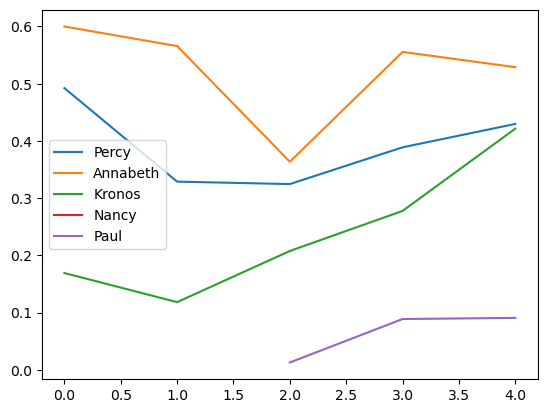

In [22]:
# Creating a list of degree centrality of all the books
evol = [nx.degree_centrality(book) for book in books_graph]

# Creating a DataFrame from the list of degree centralities in all the books
degree_evol_df = pd.DataFrame.from_records(evol)

# Plotting the degree centrality evolution of 5 main characters
degree_evol_df[["Percy","Annabeth","Kronos","Nancy","Paul"]].plot()